In [1]:
from pm4py.algo.filtering.log.variants import variants_filter
from pm4py.visualization.petri_net import visualizer as pn_visualizer
from pm4py.objects.conversion.process_tree import converter as tree_converter
from pm4py.visualization.bpmn import visualizer as bpmn_visualizer
from pm4py.objects.log.obj import EventLog
import pm4py
from collections import Counter

In [2]:
log = pm4py.read_xes("../data/BPI_Challenge_2019-3-w-after.xes")
event_log = pm4py.convert_to_event_log(log)

print(f"Number of traces: {len(event_log)}")
print(f"Number of events in first trace: {len(event_log[0])}")

/Users/I570206/dev/UniMa/PMA/is515-case-group1/.venv/lib/python3.12/site-packages/pm4py/utils.py:986: UserWarning: In the current version, the import/export operation uses `rustxes` by default for importing/exporting files faster. Please uninstall `rustxes` to revert the behavior.
  warnings.warn("In the current version, the import/export operation uses `rustxes` by default for importing/exporting files faster. Please uninstall `rustxes` to revert the behavior.")


Number of traces: 15182
Number of events in first trace: 15


In [3]:
pm4py.get_start_activities(event_log)

{'SRM: Created': 564,
 'Vendor creates invoice': 356,
 'Vendor creates debit memo': 8,
 'Create Purchase Order Item': 13035,
 'Create Purchase Requisition Item': 1219}

In [4]:
pm4py.get_end_activities(event_log)

{'SRM: Transfer Failed (E.Sys.)': 44,
 'SRM: Change was Transmitted': 38,
 'Change Delivery Indicator': 33,
 'Clear Invoice': 9258,
 'SRM: In Transfer to Execution Syst.': 26,
 'Record Service Entry Sheet': 921,
 'Create Purchase Order Item': 220,
 'Record Invoice Receipt': 1330,
 'Vendor creates debit memo': 1,
 'Change Final Invoice Indicator': 1,
 'SRM: Transaction Completed': 5,
 'Remove Payment Block': 256,
 'Cancel Invoice Receipt': 84,
 'Change Price': 74,
 'Delete Purchase Order Item': 302,
 'Set Payment Block': 58,
 'Record Goods Receipt': 2319,
 'Cancel Goods Receipt': 168,
 'Cancel Subsequent Invoice': 3,
 'Vendor creates invoice': 5,
 'SRM: Deleted': 9,
 'Reactivate Purchase Order Item': 1,
 'Change Quantity': 20,
 'Change Approval for Purchase Order': 6}

In [5]:
# Inductive Miner
process_tree = pm4py.discover_process_tree_inductive(event_log)
bpmn_model = pm4py.convert_to_bpmn(process_tree)
pm4py.view_bpmn(bpmn_model)

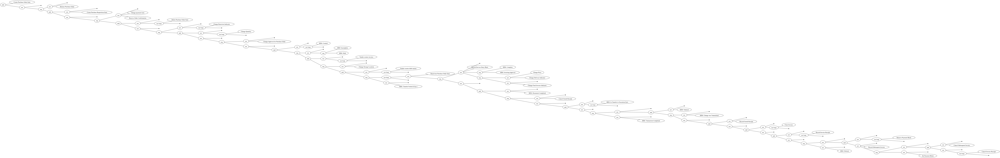

In [6]:
# Process Tree
pm4py.view_process_tree(process_tree)

In [7]:
# Process Map
dfg, start_activities, end_activities = pm4py.discover_dfg(event_log)
pm4py.view_dfg(dfg, start_activities, end_activities)

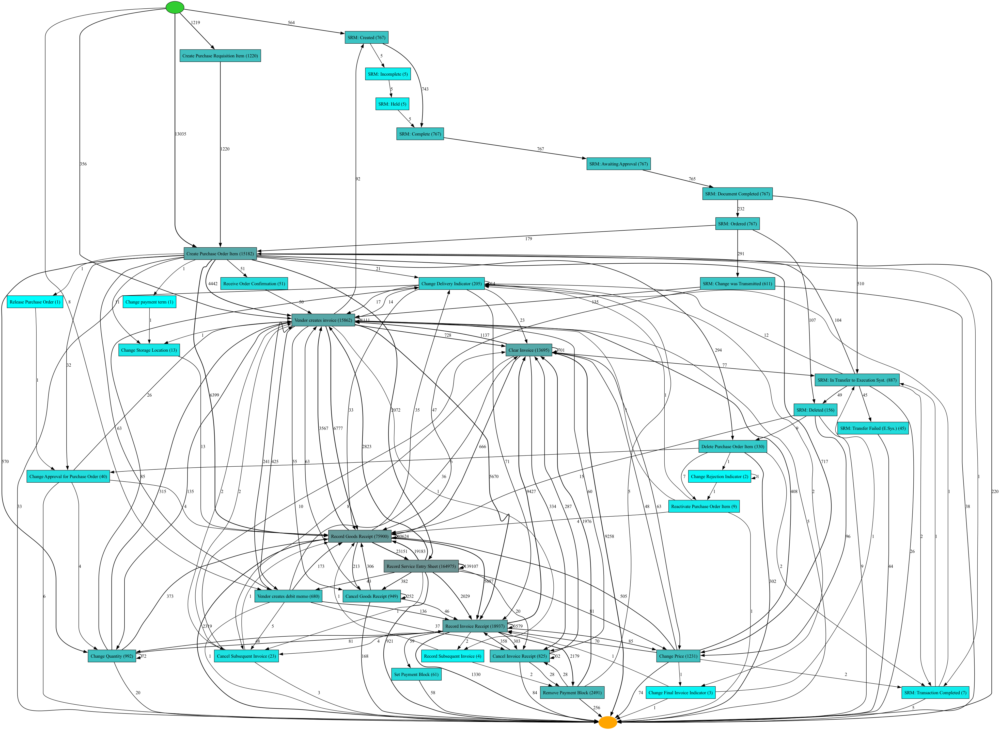

In [8]:
# Heuristic Miner
map = pm4py.discover_heuristics_net(event_log)
pm4py.view_heuristics_net(map)

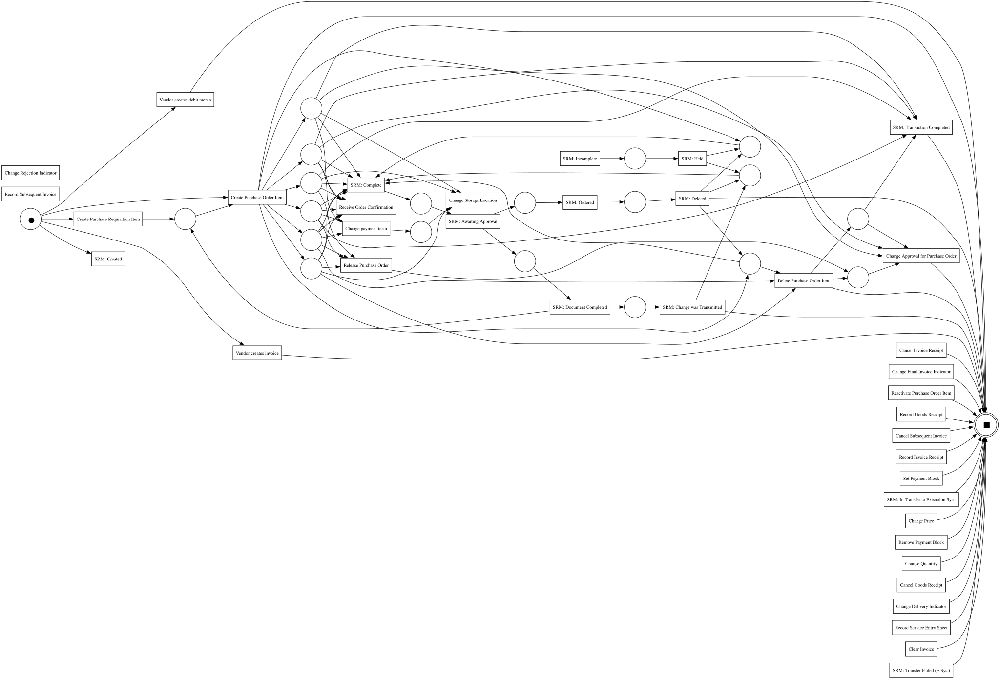

In [9]:
# Alpha Miner
net, initial_marking, final_marking = pm4py.discover_petri_net_alpha(event_log)
pn_visualizer.apply(net, initial_marking, final_marking)

## Filter by Most Common Process Paths (20)

In [10]:
variants = pm4py.get_variants_as_tuples(event_log)
print("Length of Variants: ",len(variants))

variant_counts = []
for v, val in variants.items():
    count = len(val) if not isinstance(val, int) else val
    variant_counts.append((v, count))

variant_counts.sort(key=lambda x: x[1], reverse=True)

print("Most Common Process Paths:")

for v, count in variant_counts[:20]:
    print(v, "→", count, "cases")

Length of Variants:  4228
Most Common Process Paths:
('Create Purchase Order Item', 'Vendor creates invoice', 'Record Goods Receipt', 'Record Invoice Receipt', 'Clear Invoice') → 2327 cases
('Create Purchase Order Item', 'Record Goods Receipt', 'Vendor creates invoice', 'Record Invoice Receipt', 'Clear Invoice') → 1388 cases
('Create Purchase Order Item', 'Vendor creates invoice', 'Record Goods Receipt', 'Record Invoice Receipt', 'Remove Payment Block', 'Clear Invoice') → 529 cases
('Create Purchase Order Item', 'Record Goods Receipt') → 482 cases
('Create Purchase Order Item', 'Record Goods Receipt', 'Record Invoice Receipt') → 342 cases
('Create Purchase Order Item', 'Record Goods Receipt', 'Record Service Entry Sheet', 'Vendor creates invoice', 'Record Invoice Receipt', 'Clear Invoice') → 321 cases
('Create Purchase Order Item', 'Record Goods Receipt', 'Record Service Entry Sheet') → 298 cases
('Create Purchase Order Item', 'Record Goods Receipt', 'Vendor creates invoice', 'Record I

In [11]:
top_variants = [v for v, _ in variant_counts[:20]]

filtered_log = variants_filter.apply(event_log, top_variants, parameters={"decreasingFactor": 1.0})

print(f"Original traces: {len(event_log)}")
print(f"Filtered traces: {len(filtered_log)}")

Original traces: 15182
Filtered traces: 7877


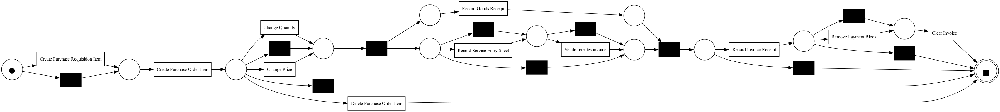

In [12]:
net, im, fm = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(net, im, fm)

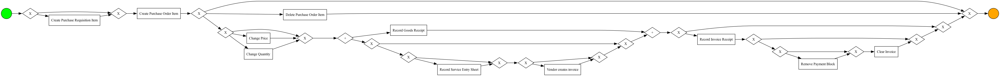

In [13]:
tree = pm4py.discover_process_tree_inductive(filtered_log)
bpmn_graph = tree_converter.apply(tree, variant=tree_converter.Variants.TO_BPMN)

gviz = bpmn_visualizer.apply(bpmn_graph)
bpmn_visualizer.view(gviz)

## Filter by Rare Activities

In [14]:
activity_counts = Counter(
    event["concept:name"]
    for trace in event_log
    for event in trace
)

min_frequency = 100

frequent_activities = {
    act for act, count in activity_counts.items()
    if count >= min_frequency
}

filtered_log = pm4py.objects.log.obj.EventLog()

for trace in event_log:
    filtered_trace = [
        event for event in trace
        if event["concept:name"] in frequent_activities
    ]
    if filtered_trace:
        filtered_log.append(filtered_trace)

print(f"Original activities: {len(activity_counts)}")
print(f"Kept activities: {len(frequent_activities)}")
print(f"Original traces: {len(log)}")
print(f"Filtered traces: {len(filtered_log)}")

Original activities: 38
Kept activities: 23
Original traces: 319233
Filtered traces: 15182


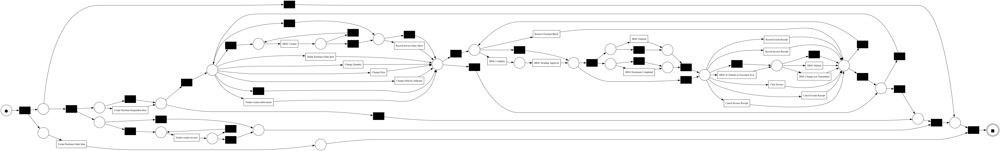

In [15]:
net, im, fm = pm4py.discover_petri_net_inductive(filtered_log)
pm4py.view_petri_net(net, im, fm)

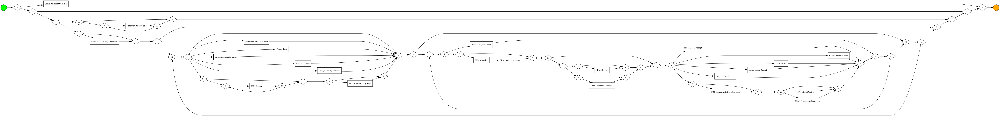

In [16]:
bpmn_model = pm4py.discover_bpmn_inductive(filtered_log)
pm4py.view_bpmn(bpmn_model)

## Cluster

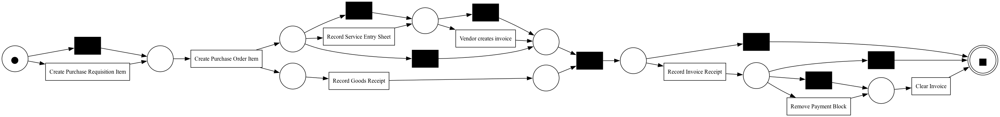

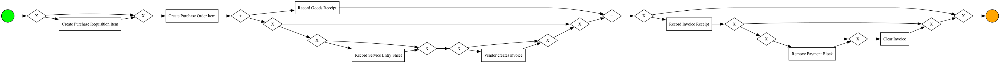

In [17]:
variants = pm4py.get_variants_as_tuples(filtered_log)
sorted_variants = sorted(variants.items(), key=lambda x: len(x[1]), reverse=True)

top_n = 10
top_clusters = sorted_variants[:top_n]


combined_traces = []
for _, cases in top_clusters:
    combined_traces.extend(cases)

combined_log = EventLog(combined_traces)

net, im, fm = pm4py.discover_petri_net_inductive(combined_log)
pm4py.view_petri_net(net, im, fm)

bpmn_model = pm4py.discover_bpmn_inductive(combined_log)
pm4py.view_bpmn(bpmn_model)
